In [2]:
!pip install ndlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.2/110.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 38.2 MB/s eta 0:00:00


In [7]:
import networkx as nx
import ndlib.models.epidemics as ep
import ndlib.models.opinions as op
import ndlib.models.ModelConfig as mc
from ndlib.viz.mpl.DiffusionTrend import DiffusionTrend
from ndlib.viz.mpl.DiffusionPrevalence import DiffusionPrevalence

no display found. Using non-interactive Agg backend


In [8]:
g = nx.erdos_renyi_graph(1000, 0.5)
nx.to_dict_of_dicts(g)

{0: {4: {},
  7: {},
  8: {},
  9: {},
  11: {},
  12: {},
  13: {},
  14: {},
  15: {},
  16: {},
  17: {},
  18: {},
  19: {},
  20: {},
  22: {},
  23: {},
  26: {},
  27: {},
  29: {},
  30: {},
  31: {},
  32: {},
  33: {},
  34: {},
  35: {},
  36: {},
  37: {},
  41: {},
  42: {},
  45: {},
  47: {},
  50: {},
  51: {},
  54: {},
  55: {},
  57: {},
  58: {},
  60: {},
  61: {},
  62: {},
  63: {},
  65: {},
  66: {},
  68: {},
  69: {},
  71: {},
  79: {},
  80: {},
  81: {},
  82: {},
  83: {},
  85: {},
  86: {},
  87: {},
  88: {},
  93: {},
  96: {},
  97: {},
  98: {},
  102: {},
  105: {},
  110: {},
  111: {},
  112: {},
  113: {},
  116: {},
  117: {},
  118: {},
  119: {},
  120: {},
  123: {},
  125: {},
  126: {},
  127: {},
  129: {},
  131: {},
  132: {},
  135: {},
  137: {},
  139: {},
  140: {},
  141: {},
  142: {},
  146: {},
  148: {},
  149: {},
  150: {},
  151: {},
  156: {},
  158: {},
  161: {},
  162: {},
  164: {},
  165: {},
  169: {},
  170: {},
  17

In [14]:
SEIR_model = ep.SEIRModel(g)
print(SEIR_model.parameters)
print(SEIR_model.available_statuses)

{'model': {'alpha': {'descr': 'Latent period (1/duration)', 'range': [0, 1], 'optional': False}, 'beta': {'descr': 'Infection rate', 'range': [0, 1], 'optional': False}, 'gamma': {'descr': 'Recovery rate', 'range': [0, 1], 'optional': False}, 'tp_rate': {'descr': 'Whether if the infection rate depends on the number of infected neighbors', 'range': [0, 1], 'optional': True, 'default': 1}}, 'nodes': {}, 'edges': {}}
{'Susceptible': 0, 'Exposed': 2, 'Infected': 1, 'Removed': 3}


In [15]:
config = mc.Configuration()
config.add_model_parameter('alpha', 0.01)
config.add_model_parameter('beta', 0.01)
config.add_model_parameter('gamma', 0.1)
SEIR_model.set_initial_status(config)

/usr/local/lib/python3.10/dist-packages/ndlib/models/DiffusionModel.py:120: UserWarning: Initial infection missing: a random sample of 5% of graph nodes will be set as infected
  warnings.warn('Initial infection missing: a random sample of 5% of graph nodes will be set as infected')


In [16]:
iterations = SEIR_model.iteration_bunch(200, node_status=True)
trends = SEIR_model.build_trends(iterations)


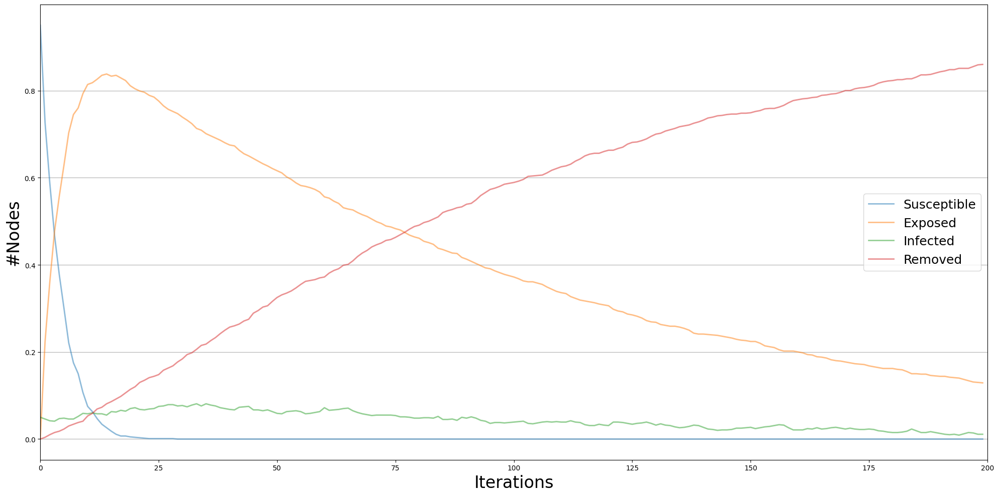

In [17]:
%matplotlib inline
viz = DiffusionTrend(SEIR_model, trends)
viz.plot()


In [18]:
SEIS_model = ep.SEISModel(g)
print(SEIS_model.parameters)
print(SEIS_model.available_statuses)

{'model': {'alpha': {'descr': 'Incubation period', 'range': [0, 1], 'optional': False}, 'beta': {'descr': 'Infection rate', 'range': [0, 1], 'optional': False}, 'lambda': {'descr': 'Recovery rate', 'range': [0, 1], 'optional': False}, 'tp_rate': {'descr': 'Whether if the infection rate depends on the number of infected neighbors', 'range': [0, 1], 'optional': True, 'default': 1}}, 'nodes': {}, 'edges': {}}
{'Susceptible': 0, 'Exposed': 2, 'Infected': 1}


In [19]:
config = mc.Configuration()
config.add_model_parameter('alpha', 0.01)
config.add_model_parameter('beta', 0.1)
config.add_model_parameter("lambda", 0.15)
SEIS_model.set_initial_status(config)

/usr/local/lib/python3.10/dist-packages/ndlib/models/DiffusionModel.py:120: UserWarning: Initial infection missing: a random sample of 5% of graph nodes will be set as infected
  warnings.warn('Initial infection missing: a random sample of 5% of graph nodes will be set as infected')


In [21]:
iterations = SEIS_model.iteration_bunch(200, node_status=True)
trends = SEIS_model.build_trends(iterations)

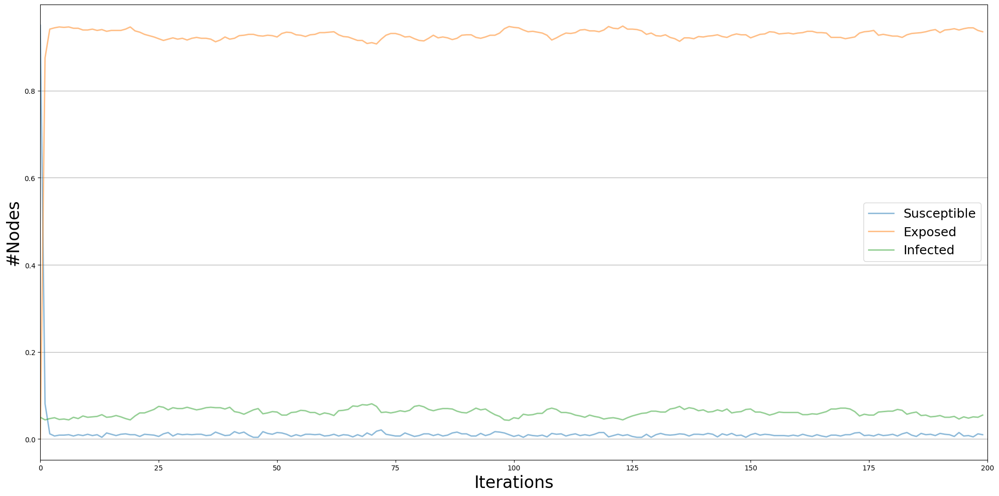

In [22]:
viz = DiffusionTrend(SEIS_model, trends)
viz.plot()


In [24]:
SIS_model = ep.SISModel(g)
print(SIS_model.parameters)
print(SIS_model.available_statuses)

{'model': {'beta': {'descr': 'Infection rate', 'range': [0, 1], 'optional': False}, 'lambda': {'descr': 'Recovery rate', 'range': [0, 1], 'optional': False}, 'tp_rate': {'descr': 'Whether if the infection rate depends on the number of infected neighbors', 'range': [0, 1], 'optional': True, 'default': 1}}, 'nodes': {}, 'edges': {}}
{'Susceptible': 0, 'Infected': 1}


In [25]:
config = mc.Configuration()
config.add_model_parameter('beta', 0.1)
config.add_model_parameter("lambda", 0.15)
SIS_model.set_initial_status(config)

/usr/local/lib/python3.10/dist-packages/ndlib/models/DiffusionModel.py:120: UserWarning: Initial infection missing: a random sample of 5% of graph nodes will be set as infected
  warnings.warn('Initial infection missing: a random sample of 5% of graph nodes will be set as infected')


In [26]:
iterations = SIS_model.iteration_bunch(200, node_status=True)
trends = SIS_model.build_trends(iterations)

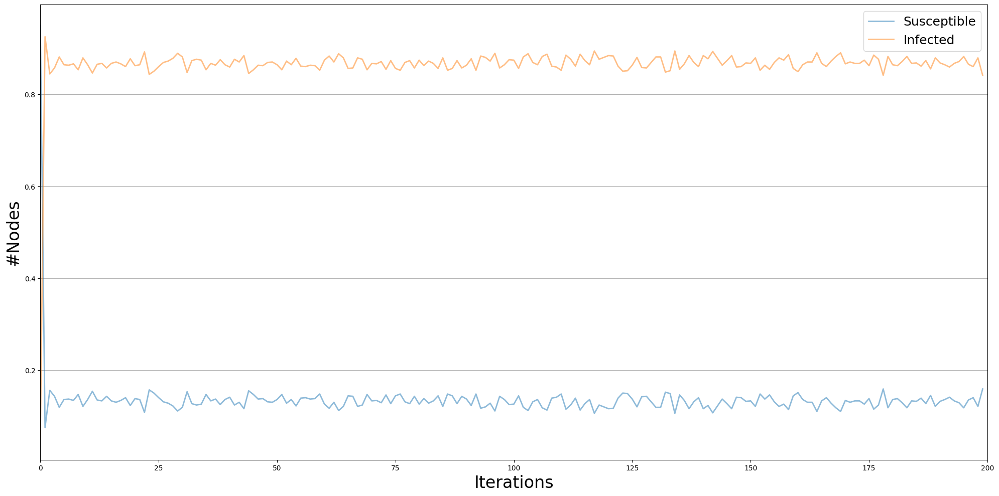

In [28]:
viz = DiffusionTrend(SIS_model, trends)
viz.plot()

In [29]:
SI_model = ep.SIModel(g)
print(SI_model.parameters)
print(SI_model.available_statuses)

{'model': {'beta': {'descr': 'Infection rate', 'range': '[0,1]', 'optional': False}, 'tp_rate': {'descr': 'Whether if the infection rate depends on the number of infected neighbors', 'range': [0, 1], 'optional': True, 'default': 1}}, 'nodes': {}, 'edges': {}}
{'Susceptible': 0, 'Infected': 1}


In [30]:
config = mc.Configuration()
config.add_model_parameter('beta', 0.001)
config.add_model_parameter('tp_rate', 0.1)
SI_model.set_initial_status(config)

/usr/local/lib/python3.10/dist-packages/ndlib/models/DiffusionModel.py:120: UserWarning: Initial infection missing: a random sample of 5% of graph nodes will be set as infected
  warnings.warn('Initial infection missing: a random sample of 5% of graph nodes will be set as infected')


In [31]:
iterations = SI_model.iteration_bunch(200, node_status=True)
trends = SI_model.build_trends(iterations)

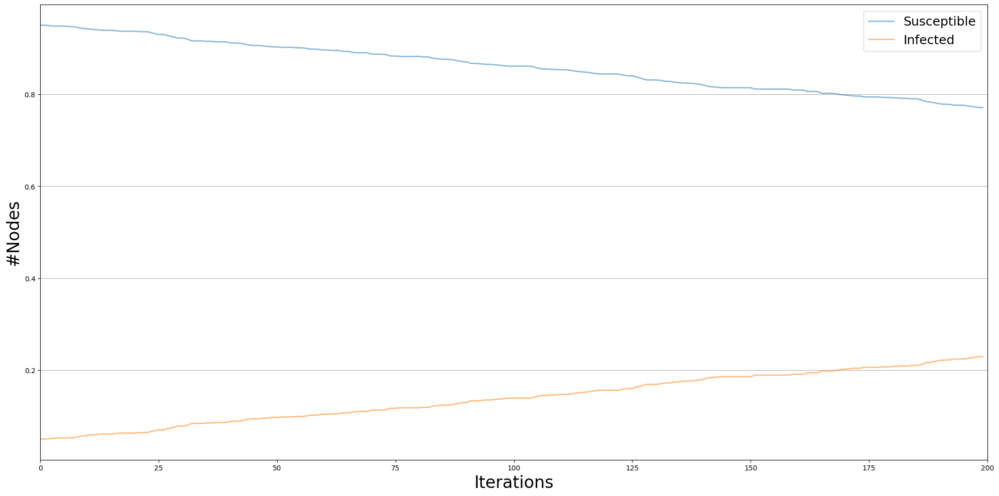

In [32]:
viz = DiffusionTrend(SI_model, trends)
viz.plot()

**При извршување на 4-те алгоритми, користев идентичен број на итерации. Клучниот сегмент за резултатот што го добиваме лежи во почетната иницијализација на параметрите, може да се увидат резултатите при користење на различни параметри.**

In [34]:
g = nx.erdos_renyi_graph(1000, 0.2)

voter = op.VoterModel(g)
print(voter.parameters)
print(voter.available_statuses)

{'model': {}, 'nodes': {}, 'edges': {}}
{'Susceptible': 0, 'Infected': 1}


In [45]:
config = mc.Configuration()
config.add_model_parameter('fraction_infected', 0.1)
voter.set_initial_status(config)

In [46]:
iterations = voter.iteration_bunch(200)

In [49]:
from ndlib.viz.mpl.OpinionEvolution import OpinionEvolution
import matplotlib.pyplot as plt

viz = OpinionEvolution(voter, iterations)
viz.plot("opinion_ev.pdf")

In [52]:
#QVoter

g = nx.erdos_renyi_graph(1000, 0.1)

# Model selection
qvoter = op.QVoterModel(g)
config = mc.Configuration()
config.add_model_parameter("q", 5)
config.add_model_parameter('fraction_infected', 0.1)

qvoter.set_initial_status(config)

# Simulation execution
iterations = qvoter.iteration_bunch(200)

In [53]:
viz = OpinionEvolution(qvoter, iterations)
viz.plot("opinion_ev.pdf")

In [55]:
#Majority Rule

mjr = op.MajorityRuleModel(g)
config = mc.Configuration()
config.add_model_parameter("q", 5)
config.add_model_parameter('fraction_infected', 0.1)

mjr.set_initial_status(config)

# Simulation execution
iterations = mjr.iteration_bunch(200)

In [56]:
viz = OpinionEvolution(mjr, iterations)
viz.plot("opinion_ev.pdf")

In [57]:
#Sznajd

sz = op.SznajdModel(g)
config = mc.Configuration()
config.add_model_parameter('fraction_infected', 0.1)

sz.set_initial_status(config)

# Simulation execution
iterations = sz.iteration_bunch(200)

In [58]:
viz = OpinionEvolution(sz, iterations)
viz.plot("opinion_ev.pdf")